## Install Required Libraries
In this step we install the required libraries.

**Optimum[Openvino]**
Optimum OpenVINO is a toolkit designed to optimize and accelerate deep learning models for inference, specifically targeting Intel hardware platforms. It integrates with Hugging Face's Optimum library, providing streamlined support for running and fine-tuning popular models like transformers, vision models, and diffusion models on Intel's CPUs, GPUs, and other AI accelerators. Optimum OpenVINO enhances performance by enabling model quantization, pruning, and other optimizations, making it easier for developers to deploy efficient AI solutions on Intel hardware.

In [1]:
!pip install --upgrade-strategy eager optimum["openvino"]
!pip install diffusers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 8.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 81.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.4/68.4 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 39.9 MB/s eta 0:00:00
  Instal

## Install Huggingface Hub and log into the hub for acessing gated models in Huggingface
Keep your Huggingface token ready, you will need in this step.

In [3]:
!pip install huggingface_hub

from huggingface_hub import notebook_login

notebook_login()

## Optimizing and Exporting Stable Diffusion XL for Intel Hardware Using OpenVINO

Below code is using the Optimum Intel library to load and export a Stable Diffusion XL model optimized for Intel hardware using the OpenVINO toolkit. Here's a short summary of what the code is doing:

**Import the Pipeline**: It imports the **OVStableDiffusionXLPipeline** class, which is designed to work with the Stable Diffusion XL model using OpenVINO for optimized inference on Intel hardware.

**Load the Model**: The code loads the Stable Diffusion XL model (**stable-diffusion-xl-base-1.0**) from the stabilityai repository on Hugging Face. The **export=True** argument indicates that the model will be converted into a format compatible with OpenVINO during this process.

**Save the Exported Model**: Finally, the code saves the exported, optimized model to a directory called **openvino-sd-xl-base-1.0**, so it can be reused for efficient inference on Intel platforms.

**<span style="color:red;">This step takes a while, please be patient. It is compressing the model weights down to INT8 precision.</span>**


In [4]:
from optimum.intel import OVStableDiffusionXLPipeline

model_id = "stabilityai/stable-diffusion-xl-base-1.0"
pipeline = OVStableDiffusionXLPipeline.from_pretrained(model_id, export=True)


# Don't forget to save the exported model
pipeline.save_pretrained("openvino-sd-xl-base-1.0")

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Framework not specified. Using pt to export the model.
Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Keyword arguments {'subfolder': '', 'trust_remote_code': False} are not expected by StableDiffusionXLImg2ImgPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Can't determine type of OV quantization config. Please specify explicitly whether you intend to run weight-only quantization or not with `weight_only` parameter. Creating an instance of OVWeightQuantizationConfig.
The model weights will be quantized to int8.
Using framework PyTorch: 2.4.0+cu121
/home/ubuntu/test/lib/python3.12/site-packages/transformers/modeling_attn_mask_utils.py:86: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if input_shape[-1] > 1 or self.sliding_window is not None:
/home/ubuntu/test/lib/python3.12/site-packages/transformers/modeling_attn_mask_utils.py:162: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the 

INFO:nncf:Statistics of the bitwidth distribution:
┍━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┑
│   Num bits (N) │ % all parameters (layers)   │ % ratio-defining parameters (layers)   │
┝━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┥
│              8 │ 100% (74 / 74)              │ 100% (74 / 74)                         │
┕━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┙


Output()

Using framework PyTorch: 2.4.0+cu121
/home/ubuntu/test/lib/python3.12/site-packages/diffusers/models/unets/unet_2d_condition.py:1110: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  if dim % default_overall_up_factor != 0:
/home/ubuntu/test/lib/python3.12/site-packages/diffusers/models/downsampling.py:136: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert hidden_states.shape[1] == self.channels
/home/ubuntu/test/lib/python3.12/site-packages/diffusers/models/downsampling.py:145: TracerWarning: Converting a tensor to a Python boolean might cause the tra

INFO:nncf:Statistics of the bitwidth distribution:
┍━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┑
│   Num bits (N) │ % all parameters (layers)   │ % ratio-defining parameters (layers)   │
┝━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┥
│              8 │ 100% (794 / 794)            │ 100% (794 / 794)                       │
┕━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┙


Output()

Using framework PyTorch: 2.4.0+cu121
/home/ubuntu/test/lib/python3.12/site-packages/torch/jit/_trace.py:1303: TracerWarning: Trace had nondeterministic nodes. Did you forget call .eval() on your model? Nodes:
	%2491 : Float(2, 4, 128, 128, strides=[65536, 16384, 128, 1], requires_grad=0, device=cpu) = aten::randn(%2485, %2486, %2487, %2488, %2489, %2490) # /home/ubuntu/test/lib/python3.12/site-packages/nncf/torch/dynamic_graph/wrappers.py:86:0
This may cause errors in trace checking. To disable trace checking, pass check_trace=False to torch.jit.trace()
  _check_trace(
/home/ubuntu/test/lib/python3.12/site-packages/torch/jit/_trace.py:1303: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
Tensor-likes are not close!

Mismatched elements: 4156 / 131072 (3.2%)
Greatest absolute difference: 0.000202178955078125 at index (1, 0, 127, 45) (up to 1e-05 allowed)
Greatest relative difference: 0.19295096572120424 a

INFO:nncf:Statistics of the bitwidth distribution:
┍━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┑
│   Num bits (N) │ % all parameters (layers)   │ % ratio-defining parameters (layers)   │
┝━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┥
│              8 │ 100% (32 / 32)              │ 100% (32 / 32)                         │
┕━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┙


Output()

Using framework PyTorch: 2.4.0+cu121


INFO:nncf:Statistics of the bitwidth distribution:
┍━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┑
│   Num bits (N) │ % all parameters (layers)   │ % ratio-defining parameters (layers)   │
┝━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┥
│              8 │ 100% (40 / 40)              │ 100% (40 / 40)                         │
┕━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┙


Output()

Using framework PyTorch: 2.4.0+cu121


INFO:nncf:Statistics of the bitwidth distribution:
┍━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┯━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┑
│   Num bits (N) │ % all parameters (layers)   │ % ratio-defining parameters (layers)   │
┝━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┿━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┥
│              8 │ 100% (195 / 195)            │ 100% (195 / 195)                       │
┕━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┷━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┙


Output()

Compiling the vae_decoder to CPU ...
Compiling the unet to CPU ...
Compiling the text_encoder_2 to CPU ...
Compiling the text_encoder to CPU ...
Compiling the vae_encoder to CPU ...


## Passing a prompt and generating an image using the Openvino optimized model
The **num_inference_steps=50** parameter specifies the number of denoising steps the diffusion model will perform during the image generation process. Here's what it means:

**What Does num_inference_steps Do?**
Diffusion Process: Stable Diffusion, like other diffusion models, generates images by iteratively refining random noise into a coherent image based on the provided prompt. This process involves a series of steps where noise is progressively reduced, and the image's details are sharpened.

**Number of Steps:** The num_inference_steps controls how many iterations the model will go through in this denoising process. In this case, it will perform 50 steps.

**Effects of num_inference_steps:**

***Lower Number of Steps (e.g., 10-20):***
The image will be generated faster.
The quality may be lower, with less detail or possible artifacts because the model has fewer opportunities to refine the image.

***Higher Number of Steps (e.g., 50-100):***
The image generation will take longer.
The resulting image is usually of higher quality, with more detail and better coherence, as the model has more opportunities to refine the image.

**Summary:**
In this code, num_inference_steps=50 means that the model will perform 50 iterations to progressively refine the generated image of "a car in a winding road." This number strikes a balance between image quality and inference time, typically resulting in a well-detailed and coherent image.

**Recommendation**
For good quality, we recomment num_inference_steps=50.

In [8]:
prompt = "car in a winding road"
image = pipeline(prompt, num_inference_steps=50).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

## Displaying Inline in Jupyter Notebook - Option 1

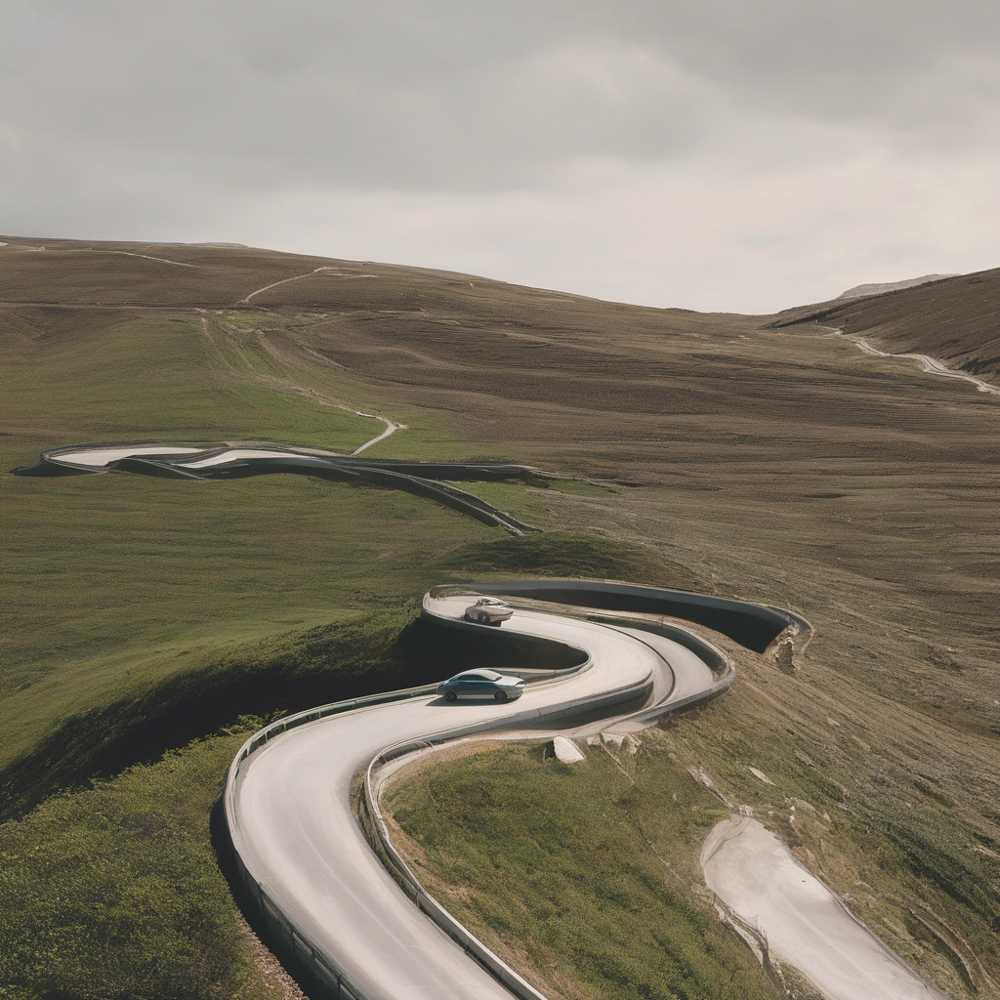

In [9]:
image.show()

## Display the Image Using PIL (Python Imaging Library) - Option 2

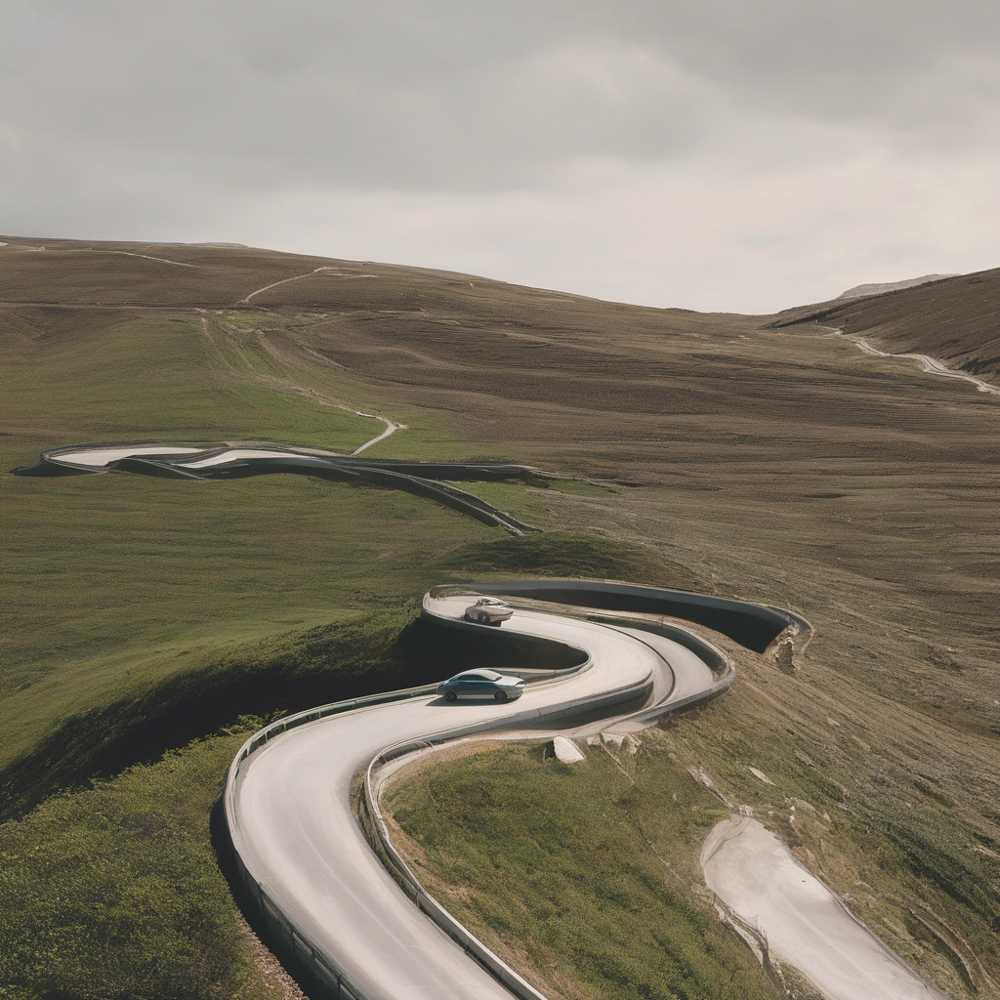

In [10]:
from PIL import Image

# If the image is not already a PIL Image object, convert it
if not isinstance(image, Image.Image):
    image = Image.fromarray(image)

# Display the image
image.show()


## Display the Image Using IPython's display - Option 3

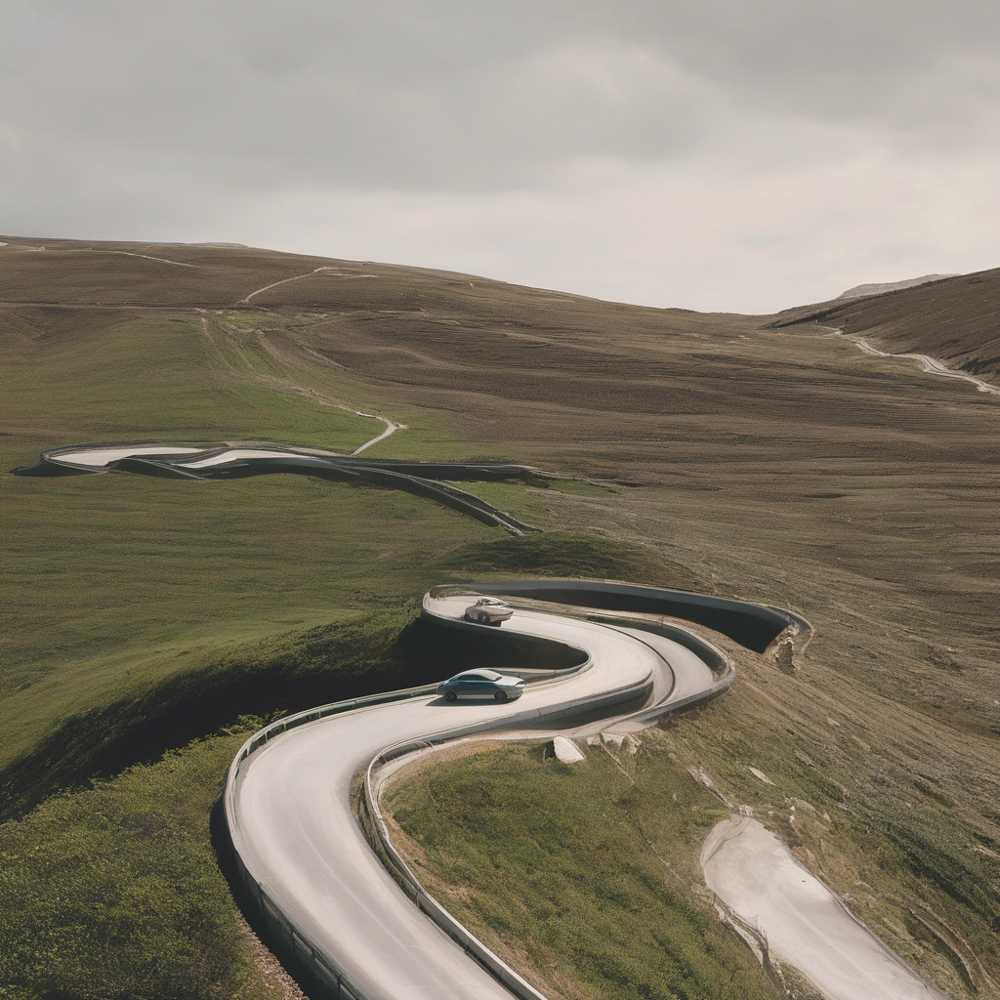

In [11]:
from IPython.display import display

# Display the generated image
display(image)


## Load the OPENVINO IR Format Model saved in prior step and run Inference

Typically converting a model using OPenvino can be a step decoupled form your inferencing workflow. Here we show, how you can use the Openvino converted model, that was saved previously. You can load the saved model and use for inferencing.

To load the OpenVINO IR format model that you've saved and run an inference for text-to-image generation, you can follow these steps:

### Step 1: Load the OpenVINO IR Model
You can load the model using the OVStableDiffusionXLPipeline class from the optimum.intel package, specifying the path to the directory where you saved the model.

### Step 2: Run Inference
After loading the model, you can perform inference just as you would with the original model.

Compiling the vae_decoder to CPU ...
Compiling the unet to CPU ...
Compiling the vae_encoder to CPU ...
Compiling the text_encoder to CPU ...
Compiling the text_encoder_2 to CPU ...


  0%|          | 0/50 [00:00<?, ?it/s]

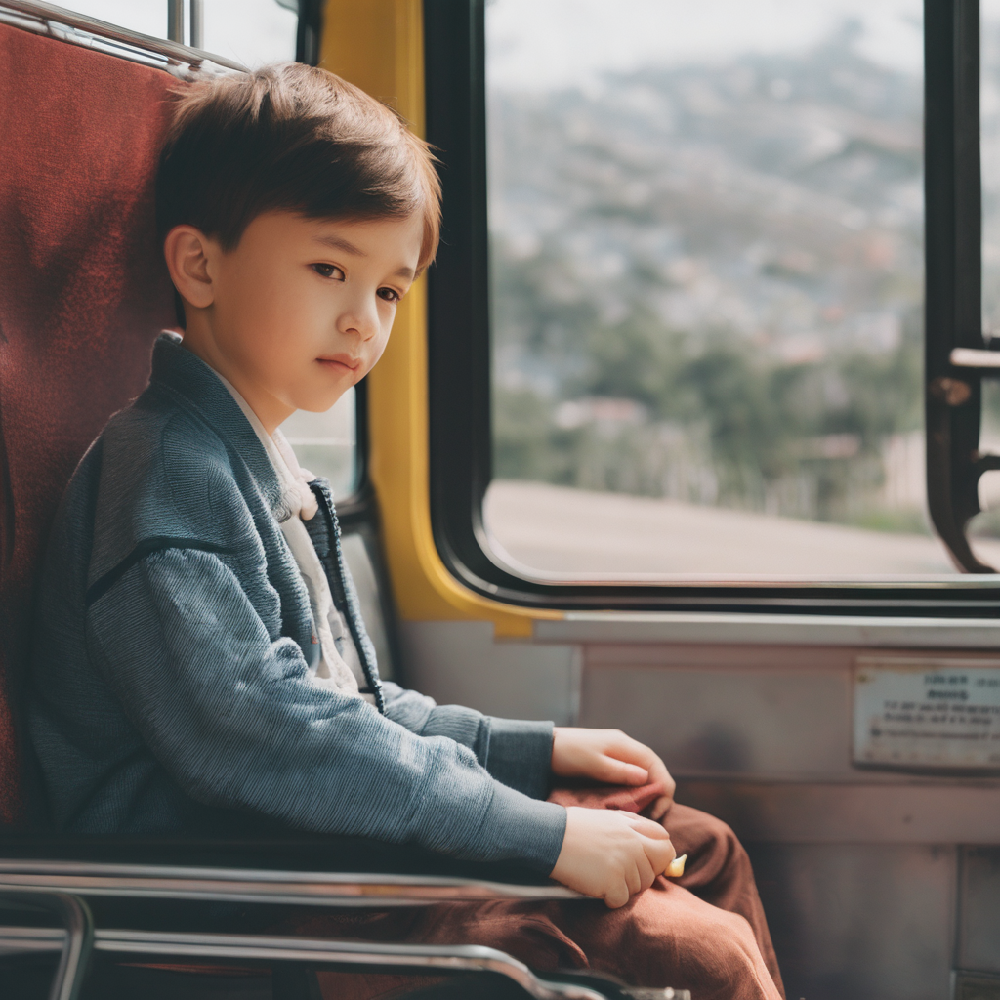

In [12]:
from optimum.intel import OVStableDiffusionXLPipeline

# Load the OpenVINO IR format model
pipeline = OVStableDiffusionXLPipeline.from_pretrained("openvino-sd-xl-base-1.0")

# Run inference for text-to-image generation
prompt = "a boy in a bus"
image = pipeline(prompt, num_inference_steps=50).images[0]

# Display the generated image
from IPython.display import display
display(image)


**<span style="color:red; font-size: 200%;">In order to use all the logical threads available in the Intel Xeon server, please make sure that hyperthreading is enabled and start the JupyterLab using all the available cores.</span>**

**<span style="color:red">taskset -c 0-31 jupyter-lab --ip 0.0.0.0 --no-browser --allow-root</span>**

### Check if Hyper-Threading (HT) is enabled on your Intel Xeon server in Linux
**Method 1: Check the Number of CPU Cores vs Logical Processors**

Run the lscpu command:
```lscpu```

Look for the lines CPU(s):, **Thread(s) per core:**, **Core(s) per socket:**, and **Socket(s):**.

**Logical processors (CPU(s):)**: This shows the total number of logical processors.
**Cores per socket (Core(s) per socket:)**: This shows the number of physical cores per socket.
**Threads per core (Thread(s) per core:)**: If this value is greater than 1, Hyper-Threading is enabled.

**Method 2: Check /proc/cpuinfo**
1. Count the number of physical cores and logical processors:
```
grep -m 1 'cpu cores' /proc/cpuinfo
grep 'processor' /proc/cpuinfo | wc -l
```
The first command shows the number of physical cores per socket.
The second command counts the number of logical processors (which are hyperthreads if HT is enabled).

**Interpretation:**

If the number of logical processors is more than the number of physical cores, Hyper-Threading is enabled.

## Leveraging All Logical Cores for Optimized Text-to-Image Generation with Stable Diffusion XL Using OpenVINO
This code sets up and runs a Stable Diffusion XL model optimized for Intel hardware using OpenVINO, with specific configuration settings to maximize CPU performance.

### Key Technical Details and Configuration:
**Environment Variables:**
The script sets several environment variables (**OMP_NUM_THREADS**, **MKL_NUM_THREADS**, **OPENBLAS_NUM_THREADS**, and **NUMEXPR_NUM_THREADS**) to 32, indicating that the script is configured to use 32 threads across various libraries (OpenMP, MKL, OpenBLAS, NumExpr) to fully utilize the CPU's parallel processing capabilities.

**OpenVINO Core Initialization:**
A Core object from OpenVINO is initialized, which is essential for managing inference devices and setting properties related to the CPU.

**CPU Configuration:**
The script configures the Core object to use 32 inference threads, sets the number of streams to 1 (indicating that inference should be done in a single stream), and binds the threads to specific CPU cores (CPU_BIND_THREAD set to YES). This setup is intended to optimize CPU performance by ensuring threads are efficiently utilized and bound to particular cores.

**Model Loading:**
The script loads a pre-trained Stable Diffusion XL model (previously exported to OpenVINO's IR format) using the customized Core object for inference.

**Inference:**
A text prompt ("boat in an ocean") is provided to the pipeline, which generates an image based on this prompt.

**Displaying the Image:**
The generated image is then displayed in the notebook using IPython.display.display.

Compiling the vae_decoder to CPU ...
Compiling the unet to CPU ...
Compiling the text_encoder to CPU ...
Compiling the text_encoder_2 to CPU ...
Compiling the vae_encoder to CPU ...


  0%|          | 0/50 [00:00<?, ?it/s]

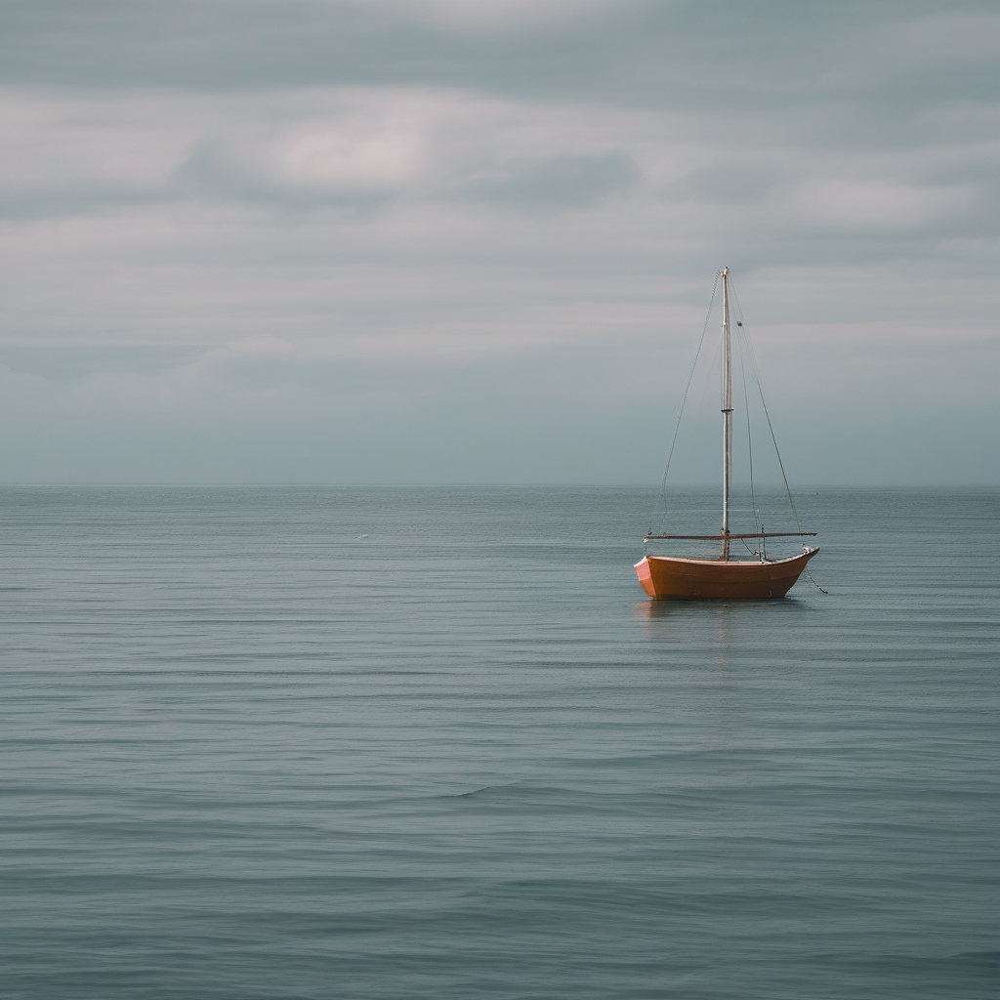

In [13]:
import os
from optimum.intel import OVStableDiffusionXLPipeline
from openvino.runtime import Core

#Use Environment Variables: Set the environment variables directly in your script to ensure they are applied:
os.environ["OMP_NUM_THREADS"] = "32"
os.environ["MKL_NUM_THREADS"] = "32"
os.environ["OPENBLAS_NUM_THREADS"] = "32"
os.environ["NUMEXPR_NUM_THREADS"] = "32"

# Initialize OpenVINO's Core object
core = Core()

# Set the number of threads to the total number of logical processors (vCPUs)
core.set_property("CPU", {
    "INFERENCE_NUM_THREADS": "32",
    "NUM_STREAMS": "1",
    "CPU_BIND_THREAD": "YES"  # Bind threads to specific cores
})

# Load the OpenVINO IR format model using the custom Core object
pipeline = OVStableDiffusionXLPipeline.from_pretrained("openvino-sd-xl-base-1.0", ov_core=core)

# Run inference for text-to-image generation
prompt = "boat in an ocean"
image = pipeline(prompt, num_inference_steps=50).images[0]

# Display the generated image
from IPython.display import display
display(image)


**<span style="background-color:darkgoldenrod;">Note - In the above step, testing on a 32 vCPU Xeon server, it appears that it is using only 16 vCPUs out of 32. Looking into the issue and working with OpenVINO support team, what can be done to solve the problem.</span>**

**Issue logged with OpenVino community** - https://community.intel.com/t5/Intel-Distribution-of-OpenVINO/Running-Stable-diffusion-XL-with-optimum-openvino-is-using-half/m-p/1627728#M31374

## Configuring and Executing Text-to-Image Generation with Custom Input Dimensions
This code snippet is configuring and running a text-to-image generation using a OPenvino converted model from a prior setp. The model is first reshaped and compiled to handle input images with specific dimensions (1 image of 512x512 pixels). After compiling the model, a prompt ("bridge over a river") is provided, and the model generates an image based on that prompt. The generated image is then displayed using the image.show() function. This process involves setting up the model for inference with the specified input/output dimensions and executing the text-to-image generation based on the given prompt.

Compiling the vae_decoder to CPU ...
Compiling the unet to CPU ...
Compiling the text_encoder to CPU ...
Compiling the text_encoder_2 to CPU ...
Compiling the vae_encoder to CPU ...


  0%|          | 0/50 [00:00<?, ?it/s]

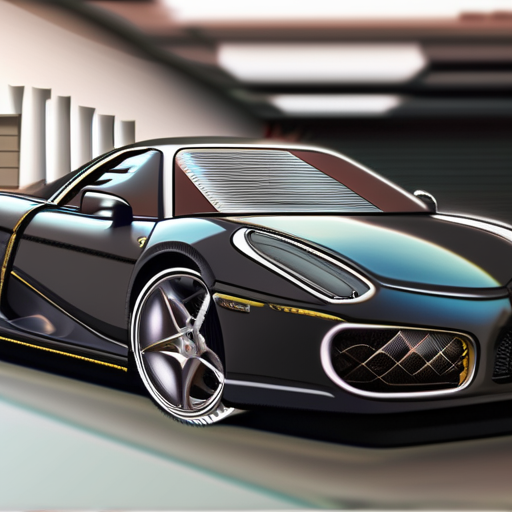

In [18]:
# Define the shapes related to the inputs and desired outputs
batch_size, num_images, height, width = 1, 1, 512, 512

# Statically reshape the model
pipeline.reshape(batch_size, height, width, num_images)
# Compile the model before inference
pipeline.compile()

prompt = "real picture of a sport car with a fancy sproiler"

image = pipeline(
    prompt,
    height=height,
    width=width,
    num_images_per_prompt=num_images,
).images[0]

image.show()

## Utilizing the Optimized OpenVINO Stable Diffusion INT8 Model for Efficient Text-to-Image Conversion
In this step, we show, how you can pull down the already optimized model OpenVINO/stable-diffusion-v1-5-int8-quant from Huggingface and use it to convert text to image. The OpenVINO/stable-diffusion-v1-5-int8-quant model is an optimized version of Stable Diffusion v1.5, a text-to-image generation model, that has been quantized to INT8 precision. This quantization enhances inference speed and reduces memory usage, particularly on Intel hardware with INT8 support. The model is further optimized using OpenVINO, making it highly efficient for fast and resource-constrained deployments on Intel architectures, ideal for scenarios where quick and efficient image generation is essential.

model_index.json:   0%|          | 0.00/641 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/755 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

text_encoder/openvino_model.xml:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

unet/openvino_model.xml:   0%|          | 0.00/6.77M [00:00<?, ?B/s]

vae_decoder/openvino_model.xml:   0%|          | 0.00/984k [00:00<?, ?B/s]

vae_encoder/openvino_model.xml:   0%|          | 0.00/686k [00:00<?, ?B/s]

openvino_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

openvino_model.bin:   0%|          | 0.00/137M [00:00<?, ?B/s]

openvino_model.bin:   0%|          | 0.00/862M [00:00<?, ?B/s]

openvino_model.bin:   0%|          | 0.00/198M [00:00<?, ?B/s]

Could not identify `in_channels` from the VAE encoder configuration, to statically reshape the VAE encoder please provide a configuration.
Compiling the vae_decoder to CPU ...
Compiling the unet to CPU ...
Compiling the vae_encoder to CPU ...
Compiling the text_encoder to CPU ...
Could not identify `in_channels` from the VAE encoder configuration, to statically reshape the VAE encoder please provide a configuration.
Compiling the vae_decoder to CPU ...
Compiling the unet to CPU ...
Compiling the vae_encoder to CPU ...
Compiling the text_encoder to CPU ...


  0%|          | 0/51 [00:00<?, ?it/s]

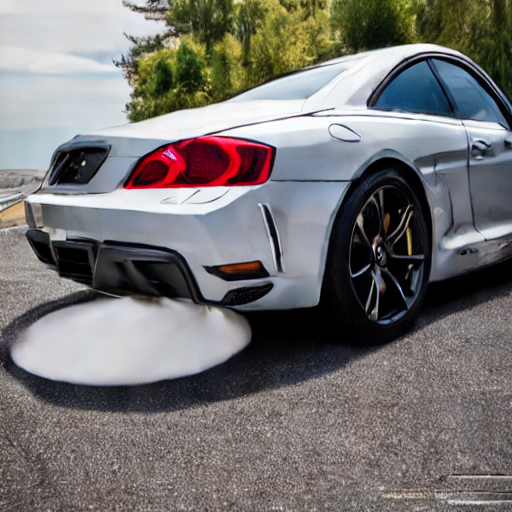

In [19]:
from optimum.intel.openvino import OVStableDiffusionPipeline
from IPython.display import display
import PIL.Image

model_id = "OpenVINO/stable-diffusion-v1-5-int8-quant"
pipeline = OVStableDiffusionPipeline.from_pretrained(model_id)
pipeline.reshape(batch_size=1, height=512, width=512, num_images_per_prompt=1)
pipeline.compile()

prompt = "real picture of a sport car with a fancy sproiler"
output = pipeline(prompt, num_inference_steps=50, output_type="pil")

# Display the generated image
display(output.images[0])
